In [1]:
from shapely.geometry import Point
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster

In [2]:
zipcodes = gpd.read_file('../data/zipcodes.geojson')
print(zipcodes.crs)
zipcodes.head( )

epsg:4326


,zip,objectid,po_name,shape_stlength,shape_starea,geometry
0,37115,1,MADISON,178783.02488886821,596553400.57885742,"MULTIPOLYGON (((-86.68725 36.31821, -86.68722 ..."
1,37216,3,NASHVILLE,75820.997821400058,188884682.28344727,"MULTIPOLYGON (((-86.73451 36.23774, -86.73425 ..."
2,37204,9,NASHVILLE,93180.292250425613,200664795.51708984,"MULTIPOLYGON (((-86.77914 36.13424, -86.77923 ..."
3,37027,11,BRENTWOOD,159760.6942933173,174978422.04101562,"MULTIPOLYGON (((-86.81258 36.06319, -86.81263 ..."
4,37064,18,FRANKLIN,28995.828320601937,46969608.005737305,"MULTIPOLYGON (((-87.02197 36.01200, -87.02140 ..."


In [3]:
zipcodes.crs = "EPSG:4326"
print(zipcodes.crs)

EPSG:4326


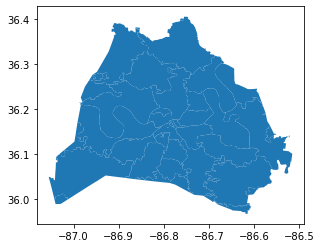

In [4]:
zipcodes.plot();

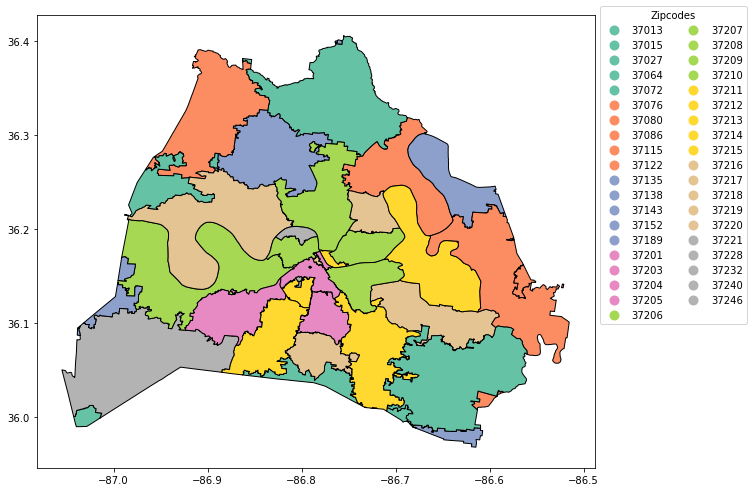

In [5]:
leg_kwds = {'title': 'Zipcodes', 'loc': 'upper left', 
            'bbox_to_anchor': (1, 1.03), 'ncol': 2}

zipcodes.plot(column = 'zip', figsize=(10, 10),
              edgecolor = 'black',
              legend = True, legend_kwds = leg_kwds, 
              cmap = 'Set2')
plt.show()

In [6]:
subrequests = pd.read_csv('../data/cleanedup_subrequests.csv')
print(subrequests.shape)
subrequests.head(3)

(348671, 8)


/opt/anaconda3/envs/geo/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (4) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Subrequest Type,Address,City,Council District,ZIP,lat,lon,Geometry
0,COVID-19 - Submit Input about The Plan to Reop...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Quick Requests,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Quick Requests,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [28]:
hub_data = pd.read_csv('../data/hubNashville__311__Service_Requests.csv')
hub_data.head()

,Request #,Status,Request Type,Subrequest Type,Additional Subrequest Type,Date / Time Opened,Date / Time Closed,Request Origin,System of Origin ID,Contact Type,...,State Issue,Parent Request,Closed When Created,Address,City,Council District,ZIP,Latitude,Longitude,Mapped Location
0,353977,Closed,COVID-19,COVID-19 - Submit Input about The Plan to Reop...,COVID-19 - Submit Input about The Plan to Reop...,04/28/2020 02:33:22 PM,04/28/2020 02:33:22 PM,hubNashville Community,NaN,NaN,...,False,NaN,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,354524,Closed,Quick Requests,Quick Requests,NaN,04/28/2020 09:46:53 PM,04/28/2020 09:46:53 PM,Phone,NaN,NaN,...,False,NaN,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,354188,Closed,Quick Requests,Quick Requests,NaN,04/28/2020 05:09:02 PM,04/28/2020 05:09:02 PM,Phone,NaN,NaN,...,False,NaN,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,354445,Closed,Quick Requests,Quick Requests,NaN,04/28/2020 08:50:36 PM,04/28/2020 08:50:36 PM,Phone,NaN,NaN,...,False,NaN,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,334893,Closed,Public Safety,Control Number Request for Towing,NaN,03/29/2020 01:08:55 AM,03/29/2020 01:08:55 AM,hubNashville Community,NaN,NaN,...,False,NaN,True,Long Hollow Pike & Northcreek Blvd,GOODLETTSVILLE,10.0,37072,36.32619,-86.700618,"(36.32619, -86.70061799999999)"


In [7]:
#nulls = subrequests['lat'].isnull()
#nulls.value_counts()

False    284188
True      64483
Name: lat, dtype: int64

In [8]:
#subrequests.tail(3)

,Subrequest Type,Address,City,Council District,ZIP,lat,lon,Geometry
348668,Missed Pickup - Trash Cart Service,3117 PENN MEADE WAY,NASHVILLE,15.0,37214,36.24230,-86.70428,"(36.2423, -86.70428)"
348669,Overgrowth on right of way,Cunniff Pkwy & Fonnic Dr,GOODLETTSVILLE,3.0,37072,36.28374,-86.74212,"(36.28374, -86.74212)"
348670,Overgrowth on right of way,SHARPE AVE & GRANADA AVE,NASHVILLE,5.0,37206,36.18901,-86.75364,"(36.18901, -86.75364)"


In [20]:
#subrequests['Subrequest Type'].value_counts()
#subrequests = subrequests['Subrequest Type'].value_counts().reset_index(name="count").query("count > 10000")["index"]
 #df2.mi.value_counts().reset_index(name="count").query("count > 5")["index"]


Quick Requests                          54141
Cart Service                            38339
Missed Pickup - Trash Cart Service      26338
Missed Pickup - Recycle Cart Service    19381
File a Trash or Recycling Complaint     16511
                                        ...  
WeGo Access                                 1
Opportunity Now                             1
Signs                                       1
Head Start                                  1
Pet Adoption                                1
Name: Subrequest Type, Length: 185, dtype: int64

In [30]:
trashy = hub_data[hub_data['Request Type'] == 'Trash, Recycling & Litter']
trashy.head()

,Request #,Status,Request Type,Subrequest Type,Additional Subrequest Type,Date / Time Opened,Date / Time Closed,Request Origin,System of Origin ID,Contact Type,...,State Issue,Parent Request,Closed When Created,Address,City,Council District,ZIP,Latitude,Longitude,Mapped Location
8,323303,Closed,"Trash, Recycling & Litter",Missed Pickup - Recycle Cart Service,Recycle - Curbside/Alley Missed Pickup,03/09/2020 04:26:34 PM,03/17/2020 09:12:24 PM,Phone,NaN,NaN,...,False,NaN,False,1113 Holly St,NASHVILLE,6.0,37206,36.176300,-86.748820,"(36.1763, -86.74882)"
10,322898,Closed,"Trash, Recycling & Litter",Cart Service,Recycling - Request an Additional Cart,03/08/2020 09:06:42 PM,03/17/2020 05:13:30 PM,hubNashville Community,NaN,NaN,...,False,NaN,False,204 Old Williamsburg Ct,NASHVILLE,25.0,37215,36.092855,-86.803188,"(36.0928545, -86.8031881)"
11,323341,Closed,"Trash, Recycling & Litter",Missed Pickup - Recycle Cart Service,Recycle - Curbside/Alley Missed Pickup,03/09/2020 04:58:32 PM,03/17/2020 05:14:48 PM,Phone,NaN,NaN,...,False,NaN,False,101 Cloister Dr,NASHVILLE,23.0,37205,36.087970,-86.885920,"(36.08797, -86.88592)"
12,323346,Closed,"Trash, Recycling & Litter",Missed Pickup - Recycle Cart Service,Recycle - Curbside/Alley Missed Pickup,03/09/2020 05:02:04 PM,03/17/2020 05:12:36 PM,hubNashville Community,NaN,NaN,...,False,NaN,False,101 Cloister Dr,NASHVILLE,23.0,37205,36.088050,-86.885930,"(36.08805, -86.88593)"
13,305782,In Progress,"Trash, Recycling & Litter",Litter,NaN,02/10/2020 09:46:38 PM,NaN,Phone,NaN,NaN,...,False,NaN,False,28th Ave N,NASHVILLE,21.0,37209,36.164902,-86.820056,"(36.1649024, -86.82005579999999)"


In [37]:
hub_data['Geometry'] = hub_data.apply(lambda x: Point((float(x.	Longitude), 
                                                         float(x.Latitude))), 
                                        axis=1)


In [39]:
hub_data_geo = gpd.GeoDataFrame(hub_data,  
                           geometry = hub_data['Geometry'])
hub_data_geo

,Request #,Status,Request Type,Subrequest Type,Additional Subrequest Type,Date / Time Opened,Date / Time Closed,Request Origin,System of Origin ID,Contact Type,...,Closed When Created,Address,City,Council District,ZIP,Latitude,Longitude,Mapped Location,Geometry,geometry
0,353977,Closed,COVID-19,COVID-19 - Submit Input about The Plan to Reop...,COVID-19 - Submit Input about The Plan to Reop...,04/28/2020 02:33:22 PM,04/28/2020 02:33:22 PM,hubNashville Community,NaN,NaN,...,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (nan nan),POINT (nan nan)
1,354524,Closed,Quick Requests,Quick Requests,NaN,04/28/2020 09:46:53 PM,04/28/2020 09:46:53 PM,Phone,NaN,NaN,...,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (nan nan),POINT (nan nan)
2,354188,Closed,Quick Requests,Quick Requests,NaN,04/28/2020 05:09:02 PM,04/28/2020 05:09:02 PM,Phone,NaN,NaN,...,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (nan nan),POINT (nan nan)
3,354445,Closed,Quick Requests,Quick Requests,NaN,04/28/2020 08:50:36 PM,04/28/2020 08:50:36 PM,Phone,NaN,NaN,...,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (nan nan),POINT (nan nan)
4,334893,Closed,Public Safety,Control Number Request for Towing,NaN,03/29/2020 01:08:55 AM,03/29/2020 01:08:55 AM,hubNashville Community,NaN,NaN,...,True,Long Hollow Pike & Northcreek Blvd,GOODLETTSVILLE,10.0,37072,36.32619,-86.700618,"(36.32619, -86.70061799999999)",POINT (-86.70061799999998 36.32619),POINT (-86.701 36.326)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
348666,2699,Closed,"Streets, Roads & Sidewalks",Potholes,Roadway,07/26/2017 02:54:00 PM,08/01/2017 08:12:00 AM,Phone,NaN,NaN,...,True,BROOK HOLLOW RD & HARDING PIKE,NASHVILLE,23.0,37205,36.09441,-86.881710,"(36.09441, -86.88171)",POINT (-86.88171 36.09441),POINT (-86.882 36.094)
348667,2214,Closed,"Trash, Recycling & Litter",Cart Service,Trash - Report a Damaged Cart,07/24/2017 04:58:00 PM,08/09/2017 04:06:00 AM,Phone,NaN,NaN,...,True,518 Benzing Rd,ANTIOCH,31.0,37013,36.04626,-86.695900,"(36.04626, -86.6959)",POINT (-86.69589999999999 36.04626),POINT (-86.696 36.046)
348668,163,Closed,"Trash, Recycling & Litter",Missed Pickup - Trash Cart Service,Trash - Curbside/Alley Missed Pickup,07/17/2017 07:12:00 AM,07/21/2017 11:58:00 AM,Phone,NaN,NaN,...,True,3117 PENN MEADE WAY,NASHVILLE,15.0,37214,36.24230,-86.704280,"(36.2423, -86.70428)",POINT (-86.70428000000001 36.2423),POINT (-86.704 36.242)
348669,3202,Closed,"Streets, Roads & Sidewalks",Overgrowth on right of way,Roadway,07/28/2017 10:07:00 AM,08/15/2017 04:02:00 AM,Phone,NaN,NaN,...,True,Cunniff Pkwy & Fonnic Dr,GOODLETTSVILLE,3.0,37072,36.28374,-86.742120,"(36.28374, -86.74212)",POINT (-86.74212 36.28374),POINT (-86.742 36.284)


In [40]:

trashy['Geometry'] = trashy.apply(lambda x: Point((float(x.Longitude), 
                                                         float(x.Latitude))), 
                                        axis=1)

/opt/anaconda3/envs/geo/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [42]:
trashy_geo = gpd.GeoDataFrame(trashy,  
                           geometry = hub_data['Geometry'])
trashy_geo.head(5)

,Request #,Status,Request Type,Subrequest Type,Additional Subrequest Type,Date / Time Opened,Date / Time Closed,Request Origin,System of Origin ID,Contact Type,...,Closed When Created,Address,City,Council District,ZIP,Latitude,Longitude,Mapped Location,Geometry,geometry
8,323303,Closed,"Trash, Recycling & Litter",Missed Pickup - Recycle Cart Service,Recycle - Curbside/Alley Missed Pickup,03/09/2020 04:26:34 PM,03/17/2020 09:12:24 PM,Phone,NaN,NaN,...,False,1113 Holly St,NASHVILLE,6.0,37206,36.176300,-86.748820,"(36.1763, -86.74882)",POINT (-86.74881999999999 36.1763),POINT (-86.74882 36.17630)
10,322898,Closed,"Trash, Recycling & Litter",Cart Service,Recycling - Request an Additional Cart,03/08/2020 09:06:42 PM,03/17/2020 05:13:30 PM,hubNashville Community,NaN,NaN,...,False,204 Old Williamsburg Ct,NASHVILLE,25.0,37215,36.092855,-86.803188,"(36.0928545, -86.8031881)",POINT (-86.8031881 36.0928545),POINT (-86.80319 36.09285)
11,323341,Closed,"Trash, Recycling & Litter",Missed Pickup - Recycle Cart Service,Recycle - Curbside/Alley Missed Pickup,03/09/2020 04:58:32 PM,03/17/2020 05:14:48 PM,Phone,NaN,NaN,...,False,101 Cloister Dr,NASHVILLE,23.0,37205,36.087970,-86.885920,"(36.08797, -86.88592)",POINT (-86.88592 36.08797),POINT (-86.88592 36.08797)
12,323346,Closed,"Trash, Recycling & Litter",Missed Pickup - Recycle Cart Service,Recycle - Curbside/Alley Missed Pickup,03/09/2020 05:02:04 PM,03/17/2020 05:12:36 PM,hubNashville Community,NaN,NaN,...,False,101 Cloister Dr,NASHVILLE,23.0,37205,36.088050,-86.885930,"(36.08805, -86.88593)",POINT (-86.88593 36.08805),POINT (-86.88593 36.08805)
13,305782,In Progress,"Trash, Recycling & Litter",Litter,NaN,02/10/2020 09:46:38 PM,NaN,Phone,NaN,NaN,...,False,28th Ave N,NASHVILLE,21.0,37209,36.164902,-86.820056,"(36.1649024, -86.82005579999999)",POINT (-86.82005579999998 36.1649024),POINT (-86.82006 36.16490)


In [43]:
trashy_geo = trashy_geo.dropna(subset=['Geometry', 'Longitude', 'Latitude'])
print(trashy_geo.shape)

(143785, 23)


In [11]:
#subrequests = gpd.GeoDataFrame(subrequests,  
#                           geometry = subrequests['Geometry'])
#subrequests

In [12]:
#subrequests.crs = "EPSG:4326"

In [13]:
#subrequests.crs

'EPSG:4326'

In [14]:
#zip_subrequests = gpd.GeoDataFrame(subrequests, 
#                           crs = zipcodes.crs, 
#                           geometry = subrequests['Geometry'])



In [15]:
zipcodes = zipcodes[['zip', 'po_name', 'geometry']]


In [45]:
trashy_by_zip = gpd.sjoin(zipcodes, trashy_geo, op = 'contains')
trashy_by_zip.head()

/opt/anaconda3/envs/geo/lib/python3.7/site-packages/geopandas/tools/sjoin.py:61: UserWarning: CRS of frames being joined does not match!(EPSG:4326 != None)
  "(%s != %s)" % (left_df.crs, right_df.crs)


,zip,po_name,geometry,index_right,Request #,Status,Request Type,Subrequest Type,Additional Subrequest Type,Date / Time Opened,...,Parent Request,Closed When Created,Address,City,Council District,ZIP,Latitude,Longitude,Mapped Location,Geometry
0,37115,MADISON,"MULTIPOLYGON (((-86.68725 36.31821, -86.68722 ...",239880,123242,Closed,"Trash, Recycling & Litter",New Service/Activate Service,New Construction Residential Recycle,12/13/2018 04:13:00 PM,...,NaN,False,141 Eagan Cir,MADISON,9.0,37115,36.264633,-86.679889,"(36.2646333, -86.6798885)",POINT (-86.6798885 36.2646333)
0,37115,MADISON,"MULTIPOLYGON (((-86.68725 36.31821, -86.68722 ...",214513,146700,Closed,"Trash, Recycling & Litter",Extra Cart Pickup Request,Extra Recycle Cart Pickup,02/25/2019 09:41:00 PM,...,NaN,False,141 Eagan Cir,MADISON,9.0,37115,36.264633,-86.679889,"(36.2646333, -86.6798885)",POINT (-86.6798885 36.2646333)
0,37115,MADISON,"MULTIPOLYGON (((-86.68725 36.31821, -86.68722 ...",188153,177593,Closed,"Trash, Recycling & Litter",Extra Cart Pickup Request,Extra Recycle Cart Pickup,05/01/2019 06:38:00 PM,...,NaN,False,141 Eagan Cir,MADISON,9.0,37115,36.264633,-86.679889,"(36.2646333, -86.6798885)",POINT (-86.6798885 36.2646333)
0,37115,MADISON,"MULTIPOLYGON (((-86.68725 36.31821, -86.68722 ...",253579,98127,Closed,"Trash, Recycling & Litter",New Service/Activate Service,Activate your Recycle Service Account,09/12/2018 02:53:00 PM,...,NaN,True,"126 Vandiver Dr, Nashville, TN 37115, United S...",MADISON,9.0,37115,36.264770,-86.678720,"(36.26477, -86.67872)",POINT (-86.67872 36.26477)
0,37115,MADISON,"MULTIPOLYGON (((-86.68725 36.31821, -86.68722 ...",262907,103719,Closed,"Trash, Recycling & Litter",Unwanted Recycling or Trash,Unwanted Trash,09/27/2018 11:15:00 AM,...,NaN,True,"143 Eagan Cir, Nashville, TN 37115, United States",MADISON,9.0,37115,36.264860,-86.679930,"(36.26486, -86.67993)",POINT (-86.67993 36.26486)


In [48]:
trashy_by_zip['zip'].value_counts()

37013    14703
37211    13383
37209    13296
37206    12123
37207    10389
37205     8500
37208     8397
37115     7712
37216     7122
37215     7016
37214     6809
37217     5827
37212     4990
37204     4819
37218     4816
37210     4424
37203     3574
37027     1477
37220     1461
37221      692
37076      440
37219      437
37189      432
37201      241
37138      236
37072      137
37080       79
37228       60
37213       33
37135       14
37086        7
37122        6
37015        6
37143        4
37064        4
37246        1
37232        1
37240        1
Name: zip, dtype: int64

In [54]:
map_nash_trashy = folium.Map(location = [36.1227, -86.8269] , zoom_start = 10)
marker_cluster = MarkerCluster().add_to(map_nash_cov)
folium.GeoJson(zipcodes).add_to(map_nash_trashy)

#iterate through trashy_geo to create locations and markers for each trash-related request

for row_index, row_values in trashy_by_zip.iterrows():
    loc = [row_values['Latitude'], row_values['Longitude']]
    pop = str(row_values['Request Type'])
    marker = folium.Marker(
        location = loc, 
        popup = pop) 
    
    marker.add_to(marker_cluster)
map_nash_trashy.save('../maps/map_nash_cov.html')

#display our map
map_nash_trashy

In [58]:
map_nash_trashy = folium.Map(location = [36.1227, -86.8269] , zoom_start = 10, tiles='Stamen Terrain')
marker_cluster = MarkerCluster().add_to(map_nash_cov)
folium.GeoJson(zipcodes).add_to(map_nash_trashy)

#create a list of locations and pass them to FastMarkerCluster()
locations = trashy_by_zip[['Latitude', 'Longitude']].values.tolist()
map_nash_trashy.add_child(
    FastMarkerCluster(locations)
)




#display our map
map_nash_trashy

In [ ]:
#subrequests_by_zip = gpd.sjoin(subrequests, zipcodes, op = 'within')

In [ ]:
#subrequests_by_zip.head()

In [ ]:
#subrequests_by_zip['zip'].value_counts()


In [ ]:
#leg_kwds = {'title': "Subrequest Type", 'loc': 'upper left',
         'bbox_to_anchor': (1, 1.03), 'ncol': 1}

#ax = zipcodes.plot(figsize = (10, 10), color = 'green')
#subrequests_by_zip.plot( ax = ax, column = 'Subrequest Type',
                    legend = True, legend_kwds = leg_kwds) ;
#plt.show();


In [ ]:
#ax = polygon37207.plot(figsize = (8, 10), color = 'lightgreen')
#stops_in_37207.plot( ax = ax, column = 'route');
#plt.show();

In [ ]:
#polygon37207.geometry.centroid

In [ ]:
#folium.Map(location =  area_center, zoom_start = 12)